In [4]:
# Update the import statement
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import numpy as np

In [8]:
#Import all VGG specific libraries
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.models import Model

In [9]:
#construct an instance if imagedatagenerator class
train_datagen = ImageDataGenerator(
    rescale = 1/255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
    
)
test_datagen = ImageDataGenerator(
    rescale = 1
)

# Train the Model using VGG19

In [10]:
#last 3 layers is false
model = VGG19(include_top = False, input_shape = (224,224,3))

In [11]:
#layers loaded are not trainable
for layer in model.layers:
    layer.trainable = False

In [12]:
#flatten the output from second last fully connected layer in VGG
flatten_layer = layers.Flatten()(model.output)

#fully connected layer with 512 hidden units
flattened_fc_layer = layers.Dense(512, activation='relu')(flatten_layer)

#the last layer, fully connected sigmoid with 5 neurons
flattened_fc_softmax_layer = layers.Dense(5, activation = 'softmax')(flattened_fc_layer)

In [13]:
# connect the custom layer with my model
model = Model(inputs = model.inputs, outputs=flattened_fc_softmax_layer)

In [14]:
training_iterator = train_datagen.flow_from_directory(r'E:\Udemy\GAN_DLNN\flower\flowers_resized\Train', batch_size = 64, target_size = (224,224))
testing_iterator = train_datagen.flow_from_directory(r'E:\Udemy\GAN_DLNN\flower\flowers_resized\Test', batch_size = 64, target_size = (224,224))

Found 3088 images belonging to 5 classes.
Found 1246 images belonging to 5 classes.


In [12]:
model.compile(loss = 'categorical_crossentropy', metrics = ['accuracy'], optimizer = 'adam' )
history = model.fit(training_iterator, validation_data = testing_iterator, epochs = 120)

Epoch 1/120
49/49 ━━━━━━━━━━━━━━━━━━━━ 394s 8s/step - accuracy: 0.3648 - loss: 6.3069 - val_accuracy: 0.6284 - val_loss: 1.0261
Epoch 2/120
49/49 ━━━━━━━━━━━━━━━━━━━━ 374s 8s/step - accuracy: 0.7139 - loss: 0.7897 - val_accuracy: 0.7271 - val_loss: 0.7257
Epoch 3/120
49/49 ━━━━━━━━━━━━━━━━━━━━ 393s 8s/step - accuracy: 0.7482 - loss: 0.6945 - val_accuracy: 0.7472 - val_loss: 0.6601
Epoch 4/120
49/49 ━━━━━━━━━━━━━━━━━━━━ 387s 8s/step - accuracy: 0.7626 - loss: 0.6555 - val_accuracy: 0.7311 - val_loss: 0.7305
Epoch 5/120
49/49 ━━━━━━━━━━━━━━━━━━━━ 372s 8s/step - accuracy: 0.7934 - loss: 0.5588 - val_accuracy: 0.7721 - val_loss: 0.6357
Epoch 6/120
49/49 ━━━━━━━━━━━━━━━━━━━━ 375s 8s/step - accuracy: 0.8022 - loss: 0.5507 - val_accuracy: 0.7496 - val_loss: 0.6446
Epoch 7/120
49/49 ━━━━━━━━━━━━━━━━━━━━ 376s 8s/step - accuracy: 0.7801 - loss: 0.5838 - val_accuracy: 0.7528 - val_loss: 0.6921
Epoch 8/120
49/49 ━━━━━━━━━━━━━━━━━━━━ 372s 8s/step - accuracy: 0.8193 - loss: 0.5069 - val_accuracy: 0.

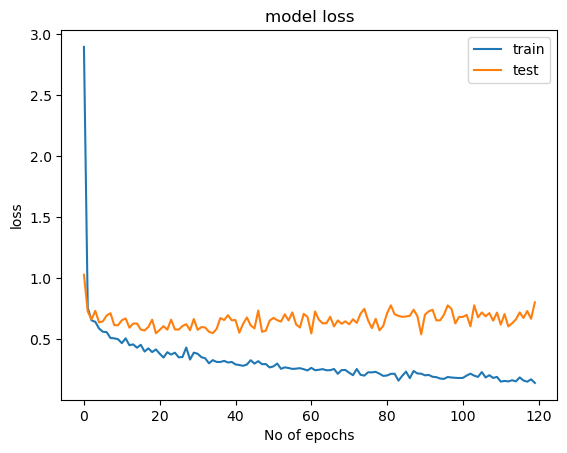

In [13]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('No of epochs')
plt.legend(['train', 'test'], loc = 'upper right')
plt.show()

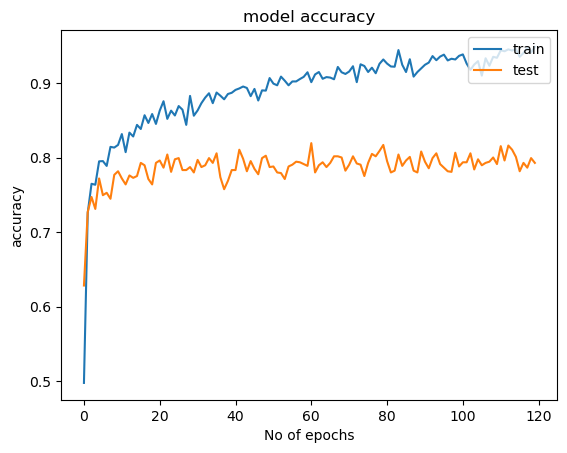

In [14]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('No of epochs')
plt.legend(['train', 'test'], loc = 'upper right')
plt.show()

In [15]:
class_labels = training_iterator.class_indices
class_labels

{'daisy': 0, 'dandelion': 1, 'rose': 2, 'sunflower': 3, 'tulip': 4}

In [ ]:
#save the model
model.save(r'E:\Udemy\GAN_DLNN\flower\VGG19/Flower_vgg19_224_224.keras')

# Make Predictions and Test the Model

In [1]:
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img,  img_to_array

In [21]:
model = load_model(r'E:\Udemy\GAN_DLNN\flower\VGG19/Flower_vgg19_224_224.keras')

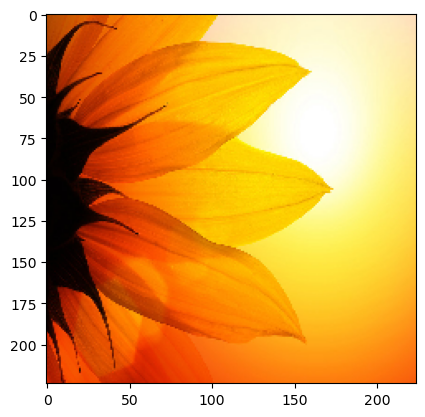

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step
[[0. 0. 0. 1. 0.]]


'sunflower'

In [22]:
#image must be 224*224
img = load_img(r'E:\Udemy\GAN_DLNN\flower\VGG19\Image_predictions\sun_pred_2.jpg', target_size=(224,224))
plt.imshow(img)
plt.show()
#convert img to array and add dimension
img = img_to_array(img)
img = img.reshape(1,224,224,3)
pred = model.predict(img)
print(pred)
result = np.argmax(pred)
[key for key in class_labels][result]

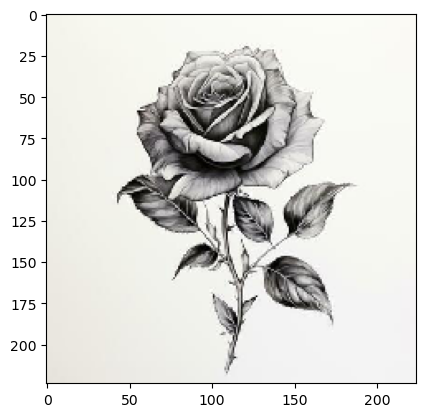

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
[[1.0000000e+00 4.4587039e-22 1.2399090e-31 8.4051127e-14 3.1337303e-29]]


'daisy'

In [23]:
img1 = load_img(r'E:\Udemy\GAN_DLNN\flower\VGG19\Image_predictions\rose_pred_1.jpg', target_size=(224,224))
plt.imshow(img1)
plt.show()
#convert img to array and add dimension
img1 = img_to_array(img1)
img1 = img1.reshape(1,224,224,3)
pred1 = model.predict(img1)
print(pred1)
result1 = np.argmax(pred1)
[key for key in class_labels][result1]

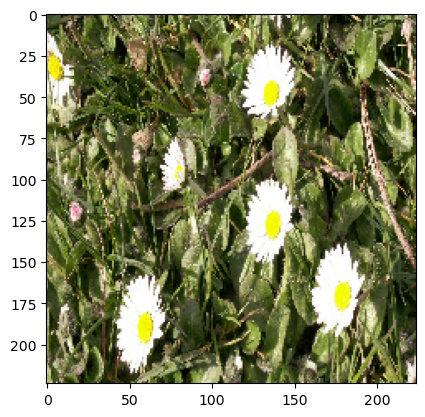

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
[[1.0000000e+00 0.0000000e+00 0.0000000e+00 2.1539357e-21 0.0000000e+00]]


'daisy'

In [24]:
img2 = load_img(r'E:\Udemy\GAN_DLNN\flower\VGG19\Image_predictions\daisy_pred_1.jpg', target_size=(224,224))
plt.imshow(img2)
plt.show()
#convert img to array and add dimension
img2 = img_to_array(img2)
img2 = img2.reshape(1,224,224,3)
pred2 = model.predict(img2)
print(pred2)
result2 = np.argmax(pred2)
[key for key in class_labels][result2]

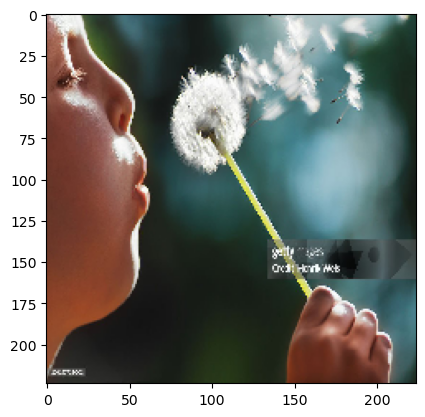

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
[[0. 1. 0. 0. 0.]]


'dandelion'

In [25]:
img3 = load_img(r'E:\Udemy\GAN_DLNN\flower\VGG19\Image_predictions\dan_pred_2.jpg', target_size=(224,224))
plt.imshow(img3)
plt.show()
#convert img to array and add dimension
img3 = img_to_array(img3)
img3 = img3.reshape(1,224,224,3)
pred3 = model.predict(img3)
print(pred3)
result3 = np.argmax(pred3)
[key for key in class_labels][result3]

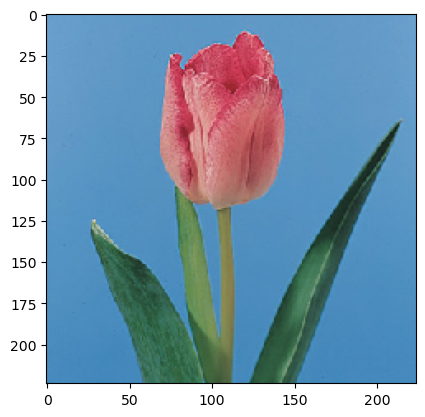

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
[[0. 0. 0. 0. 1.]]


'tulip'

In [26]:
img4 = load_img(r'E:\Udemy\GAN_DLNN\flower\VGG19\Image_predictions\tulip_pred_2.jpg', target_size=(224,224))
plt.imshow(img4)
plt.show()
#convert img to array and add dimension
img4 = img_to_array(img4)
img4 = img4.reshape(1,224,224,3)
pred4 = model.predict(img4)
print(pred4)
result4 = np.argmax(pred4)
[key for key in class_labels][result4]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


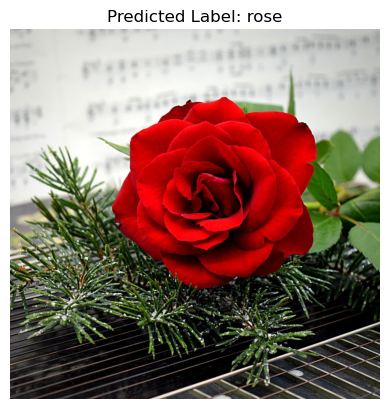

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


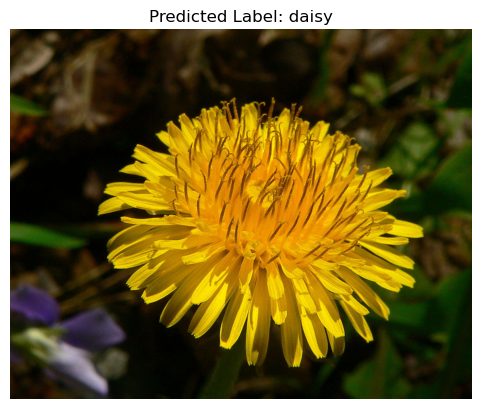

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


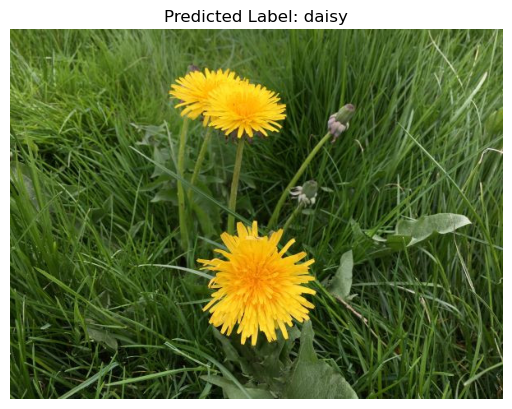

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


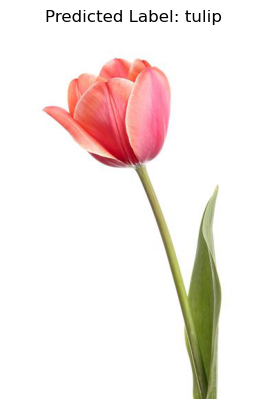

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


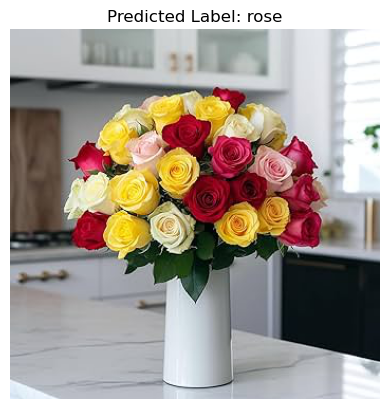

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


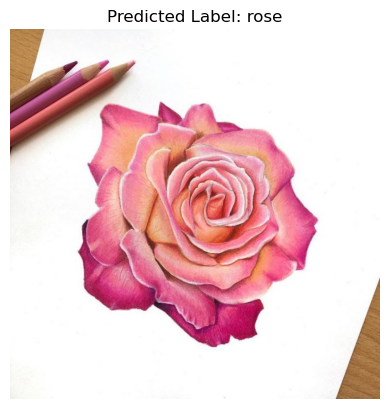

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


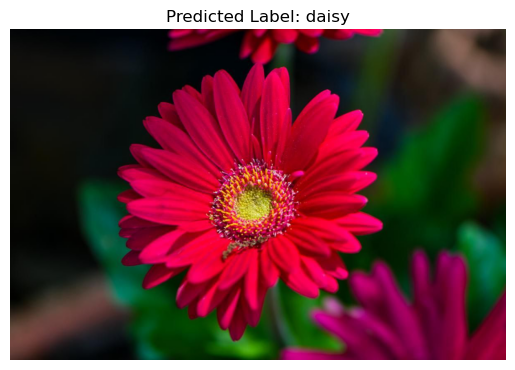

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


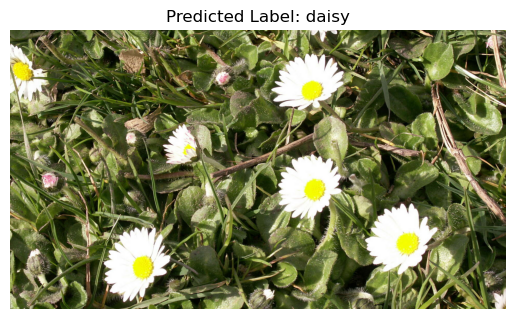

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


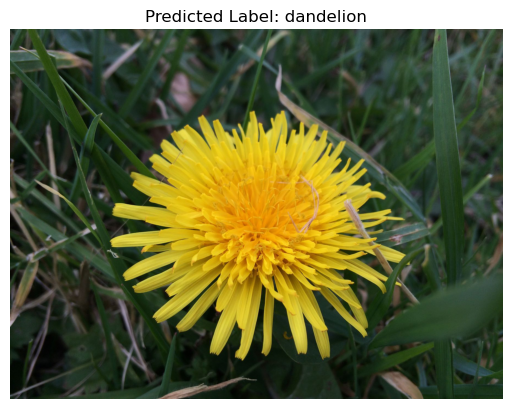

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


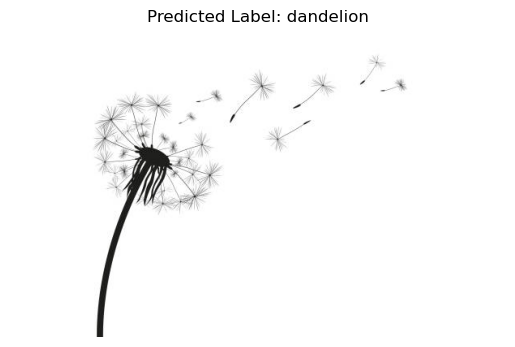

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


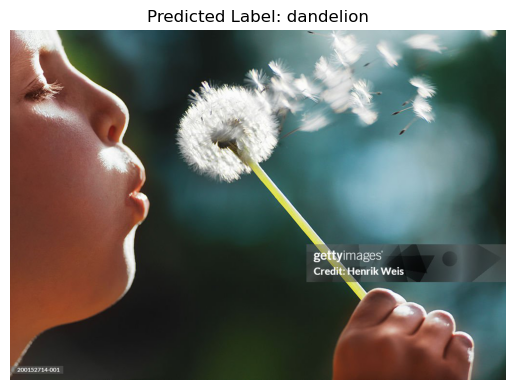

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


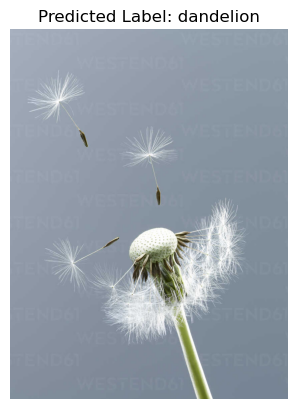

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


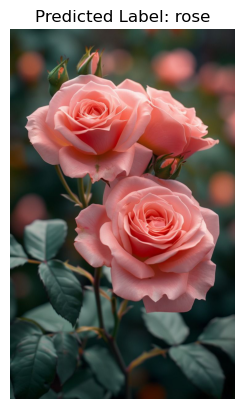

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


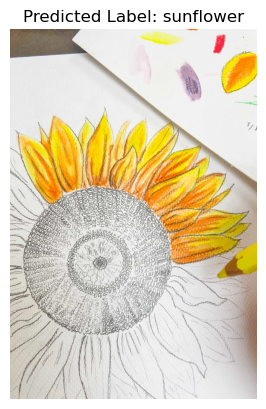

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


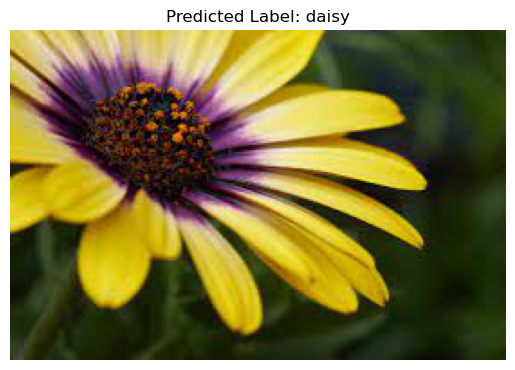

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


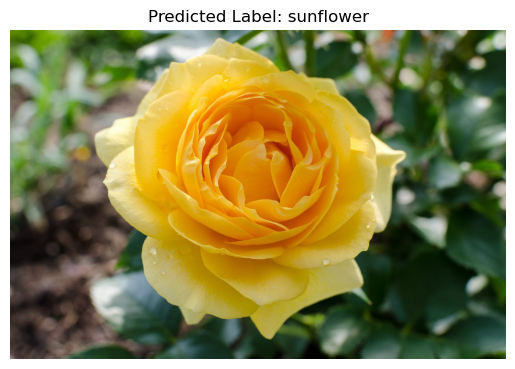

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


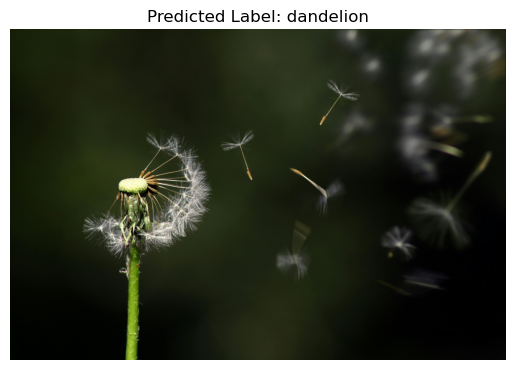

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


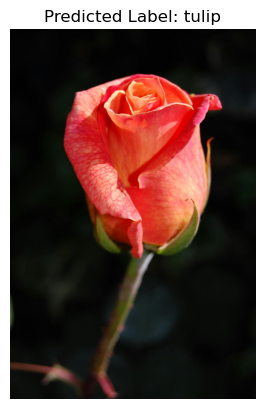

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


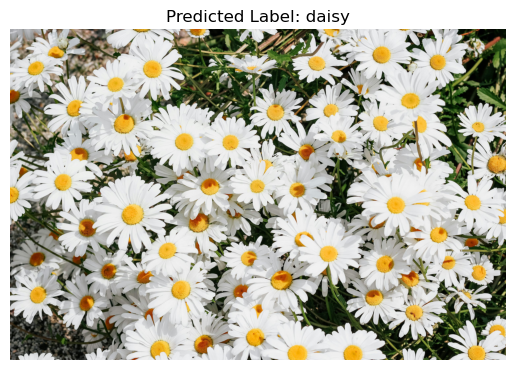

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


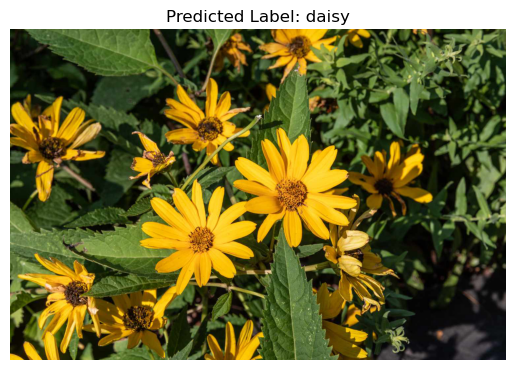

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


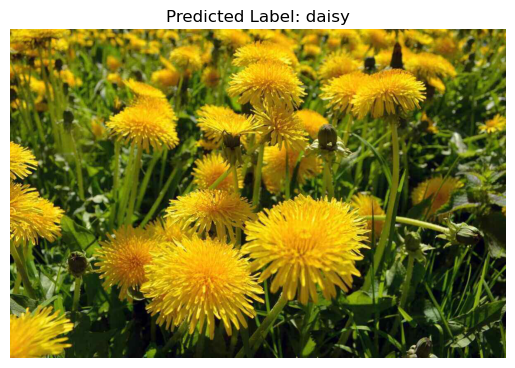

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


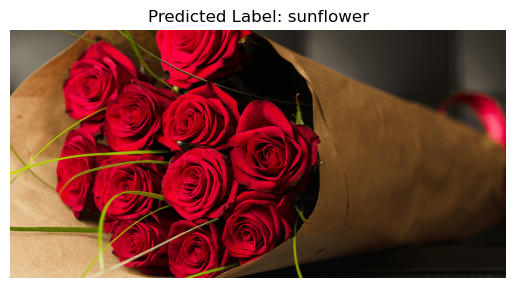

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


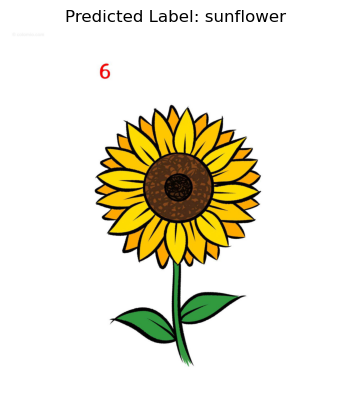

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


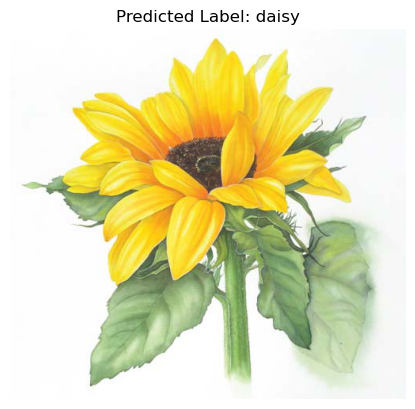

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


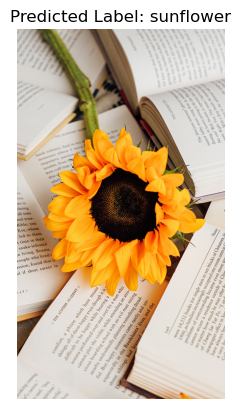

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


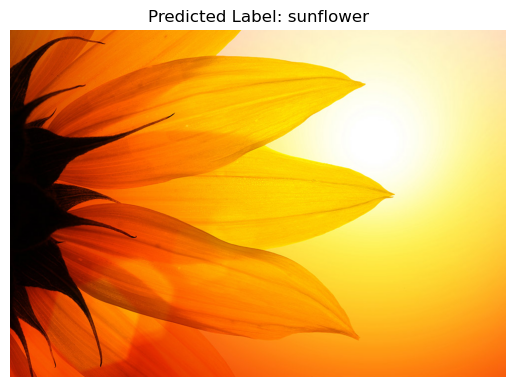

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


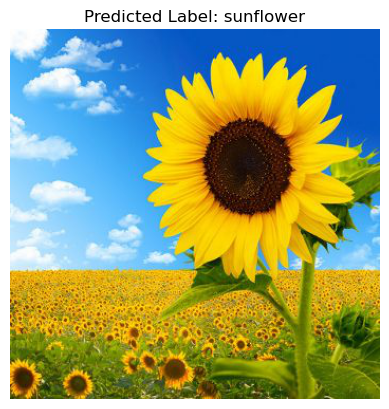

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


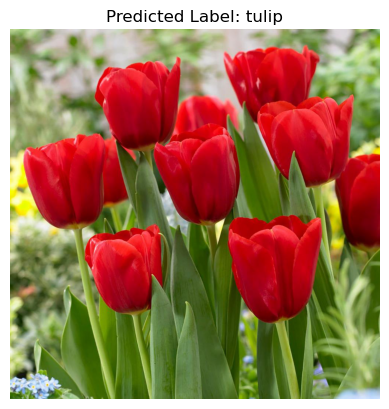

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


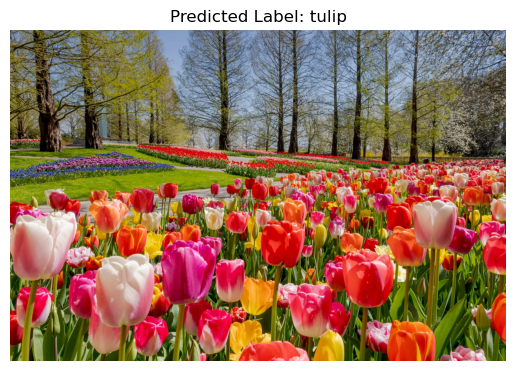

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


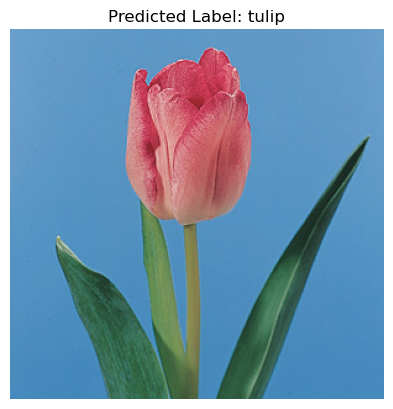

In [74]:
import os
import numpy as np
import matplotlib.pyplot as plt
from keras.preprocessing.image import load_img, img_to_array
from keras.applications.vgg16 import preprocess_input  

# Function to make predictions on a directory of images and display the images with predictions
def get_predictions_and_visualize(directory_path, model, class_labels, target_size=(224, 224)):
    # Iterate over all files in the directory
    for filename in os.listdir(directory_path):
        if filename.endswith(('.png', '.jpg', '.jpeg')):  # Check for image files
            img_path = os.path.join(directory_path, filename)
            
            # Load and preprocess the image
            img = load_img(img_path, target_size=target_size)  # Load image with target size
            img_array = img_to_array(img)  # Convert image to array
            img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension (1, height, width, channels)
            img_array = preprocess_input(img_array)  # Preprocess according to your model requirements
            
            # Make prediction
            pred = model.predict(img_array)
            pred_class = np.argmax(pred)  # Get the class with the highest probability
            pred_label = class_labels[pred_class]  # Map class index to label
            
            # Plot the image and predicted label
            plt.imshow(load_img(img_path))  # Display the image
            plt.title(f"Predicted Label: {pred_label}")  # Show the predicted label as title
            plt.axis('off')  # Hide axis
            plt.show()


class_labels = ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']

image_directory = r'E:\Udemy\GAN_DLNN\flower\VGG19\Image_predictions'
get_predictions_and_visualize(image_directory, model, class_labels)

**This model is able to predict even some complex angle and sketches. Need more accurate samples of roses to train and distuinguish from tulip and Daisy. Samples of different color roses i.e. yellow, black, purple need in the train and test data. Also, need more samples of yellow dandelions to distinguish from sunflower and daisy.**

Author\
**Md Zahid Hasan**\
**Master's Degree in Artificial Intelligence**\
**Johannes Kepler University Linz**
